In [ ]:
%cd /scratch/RDS_RS02810_AML

/scratch/RDS_RS02810_AML


In [ ]:
!pip install \
  transformers \
  accelerate \
  peft \
  bitsandbytes \
  datasets \
  ftfy \
  torch \
  torchvision \
  safetensors \
  opencv-python \
  matplotlib \
  insightface \
  onnxruntime-gpu \
  onnxruntime \
  scikit-learn \
  pandas \
  numpy \
  matplotlib \
  Pillow \
  torchmetrics \
  insightface \
  onnxruntime \
  facenet-pytorch \
  lpips \
  ipywidgets

# YOU MIGHT HAVE TO RESTART THE SESSION OR RESET THE KERNEL FOR THE DIFFUSERS REPO AND LIBRARY TO GET ALONG

In [ ]:
import os
import pandas as pd
from collections import Counter
import sys
import shutil
import torch
import json

sys.path.append("/scratch/RDS_RS02810_AML/diffusers/src")

from diffusers import StableDiffusionPipeline

In [ ]:
os.makedirs(
    "/scratch/RDS_RS02810_AML/personalization_data/identity_861/one_shot/train",
    exist_ok=True
)


In [ ]:
ROOT = "/scratch/RDS_RS02810_AML"

IMAGE_DIR = f"{ROOT}/CelebA_HQ/CelebA-HQ-img"

IDENTITY_CSV = (
    f"{ROOT}/CelebA_HQ/CelebAMask-HQ-identity.csv"
)

ATTRIBUTE_CSV = (
    f"{ROOT}/CelebA_HQ/CelebAMask-HQ-attribute-anno.csv"
)

OUTPUT_ROOT = (
    f"{ROOT}/personalization_data"
)

IDENTITY_ID = 861


In [ ]:
# ======================================================
# CREATE ALL_IMAGES FOLDER FOR IDENTITY 861
# ======================================================

identity_name = f"identity_{IDENTITY_ID}"

BASE_DIR = os.path.join(
    OUTPUT_ROOT,
    identity_name
)

ALL_IMAGES_DIR = os.path.join(
    BASE_DIR,
    "all_images"
)

ONE_SHOT_DIR = os.path.join(
    BASE_DIR,
    "one_shot",
    "train"
)

os.makedirs(ALL_IMAGES_DIR, exist_ok=True)
os.makedirs(ONE_SHOT_DIR, exist_ok=True)

identity_df = pd.read_csv(IDENTITY_CSV)

identity_images = identity_df[
    identity_df["identity_id"] == IDENTITY_ID
]["hq_filename"].tolist()

print(f"Found {len(identity_images)} images")

Found 28 images


In [ ]:
for img_name in identity_images:

    src = os.path.join(
        IMAGE_DIR,
        img_name
    )

    dst = os.path.join(
        ALL_IMAGES_DIR,
        img_name
    )

    if os.path.exists(src):

        shutil.copy(src, dst)

print("Copied all identity images")

Copied all identity images


In [ ]:
for file in os.listdir(ONE_SHOT_DIR):

    os.remove(
        os.path.join(
            ONE_SHOT_DIR,
            file
        )
    )

one_shot_image = identity_images[0]

src = os.path.join(
    ALL_IMAGES_DIR,
    one_shot_image
)

dst = os.path.join(
    ONE_SHOT_DIR,
    one_shot_image
)

shutil.copy(src, dst)

print("1-shot dataset ready")

1-shot dataset ready


In [ ]:
metadata = []

for img in os.listdir(ONE_SHOT_DIR):

    caption = "photo of sks_person"

    metadata.append({

        "file_name": img,

        "text": caption
    })

    print(img)
    print(caption)
    print()

metadata_path = os.path.join(
    ONE_SHOT_DIR,
    "metadata.jsonl"
)

with open(metadata_path, "w") as f:

    for item in metadata:

        f.write(json.dumps(item) + "\n")

print("1-shot metadata created")

183.jpg
photo of sks_person

1-shot metadata created


In [ ]:
print("\n1-SHOT")
print(os.listdir(
    "/scratch/RDS_RS02810_AML/"
    "personalization_data/identity_861/"
    "one_shot/train"
))


1-SHOT
['metadata.jsonl', '183.jpg']


In [ ]:

import gc
import torch

for var in ["pipe", "generator"]:

    if var in globals():
        del globals()[var]

gc.collect()

torch.cuda.empty_cache()

torch.cuda.ipc_collect()

print("GPU memory cleared.")

GPU memory cleared.


# One Shot Training

In [ ]:
os.system(
'''
accelerate launch diffusers/examples/text_to_image/train_text_to_image_lora.py \
--pretrained_model_name_or_path="/scratch/RDS_RS02810_AML/final_sd14_model" \
--train_data_dir="/scratch/RDS_RS02810_AML/personalization_data/identity_861/one_shot" \
--caption_column="text" \
--output_dir="/scratch/RDS_RS02810_AML/outputs/standard_lora_1shot" \
--resolution=512 \
--train_batch_size=1 \
--gradient_accumulation_steps=1 \
--learning_rate=2e-5 \
--lr_scheduler="constant" \
--max_train_steps=250 \
--mixed_precision="fp16" \
--seed=42 \
--rank=32
'''
)

/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/accelerate/accelerator.py:528: UserWarning: `log_with=tensorboard` was passed but no supported trackers are currently installed.
  warnings.warn(f"`log_with={log_with}` was passed but no supported trackers are currently installed.")
05/11/2026 06:14:41 - INFO - __main__ - [RANK 0] Distributed environment: DistributedType.NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

{'variance_type', 'thresholding', 'rescale_betas_zero_snr', 'sample_max_value', 'dynamic_thresholding_ratio', 'clip_sample_range'} was not found in config. Values will be initialized to default values.
Loading weights: 100%|██████████| 196/196 [00:00<00:00, 15508.38it/s]
All model checkpoint weights were used when initializing AutoencoderKL.

All the weights of AutoencoderKL were initialized from the model checkpoint at /scratch/RDS_RS02810_AML/final_sd14_model.
If your task is similar to the task the model of

0

In [ ]:
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained(
    "/scratch/RDS_RS02810_AML/final_sd14_model",
    torch_dtype=torch.float16
).to("cuda")

pipe.safety_checker = None

pipe.load_lora_weights(
    "/scratch/RDS_RS02810_AML/outputs/standard_lora_1shot"
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


In [ ]:
# ============================================
# 1-SHOT GENERATION
# ============================================

import torch
from diffusers import StableDiffusionPipeline
import os
from PIL import Image
import matplotlib.pyplot as plt

pipe = StableDiffusionPipeline.from_pretrained(
    "/scratch/RDS_RS02810_AML/final_sd14_model",
    torch_dtype=torch.float16
).to("cuda")

pipe.load_lora_weights(
    "/scratch/RDS_RS02810_AML/outputs/standard_lora_1shot"
)

prompts = [

    "photo of sks_person smiling",

    "photo of sks_person with mouth slightly open",

    "photo of sks_person with high cheekbones",

    "photo of sks_person with pale skin",

    "photo of sks_person with wavy hair",

    "close-up photo of sks_person",

    "portrait of sks_person",

    "photo of sks_person looking at camera",

    "photo of sks_person with earrings",

    "photo of sks_person"
]

SAVE_DIR = "/scratch/RDS_RS02810_AML/generated_1shot"

os.makedirs(SAVE_DIR, exist_ok=True)

all_images = []

counter = 0

from tqdm.auto import tqdm

pipe.set_progress_bar_config(disable=True)

total_images = len(prompts) * 30

pbar = tqdm(total=total_images)

for prompt in prompts:

    for i in range(30):

        image = pipe(
            prompt,
            num_inference_steps=30,
            guidance_scale=7.5,
            cross_attention_kwargs={"scale": 1.0}
        ).images[0]

        save_path = os.path.join(
            SAVE_DIR,
            f"img_{counter}.png"
        )

        image.save(save_path)

        all_images.append(image)

        counter += 1

        pbar.update(1)

pbar.close()

print(f"Generated {len(all_images)} images")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


  0%|          | 0/300 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generated 300 images


# Results and Visualization

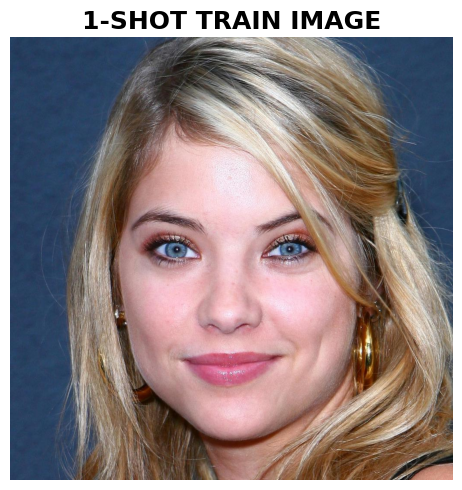

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import os

train_dir = (
    "/scratch/RDS_RS02810_AML/"
    "personalization_data/identity_861/"
    "one_shot/train"
)

train_images = sorted(os.listdir(train_dir))

fig, ax = plt.subplots(
    figsize=(5,5)
)

img = Image.open(
    os.path.join(
        train_dir,
        train_images[0]
    )
)

ax.imshow(img)

ax.axis("off")

ax.set_title(
    "1-SHOT TRAIN IMAGE",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()

plt.show()

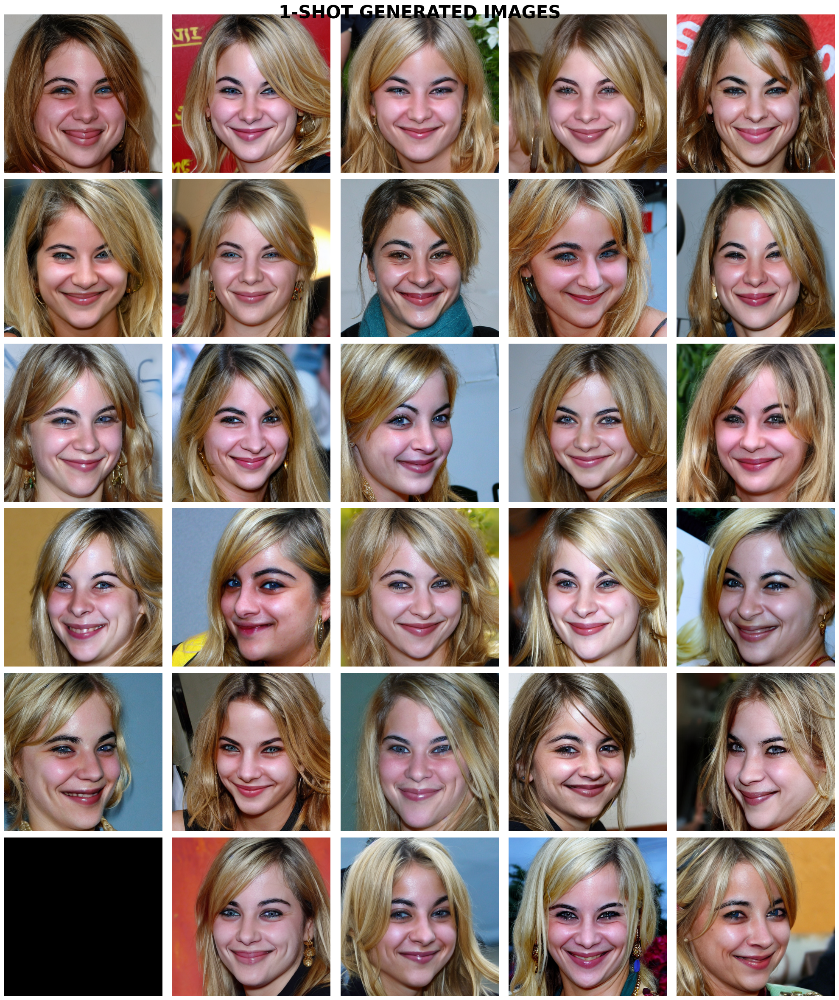

In [ ]:
# ============================================
# DISPLAY 1-SHOT GENERATED IMAGES
# ============================================

import math

cols = 5
rows = math.ceil(len(all_images[:30]) / cols)

fig, axes = plt.subplots(
    rows,
    cols,
    figsize=(20, rows * 4)
)

axes = axes.flatten()

for ax, img in zip(axes, all_images[:30]):

    ax.imshow(img)
    ax.axis("off")

for ax in axes[len(all_images[:30]):]:
    ax.axis("off")

plt.suptitle(
    "1-SHOT GENERATED IMAGES",
    fontsize=30,
    fontweight="bold"
)

plt.tight_layout()

plt.show()

In [ ]:

import os
import cv2
import glob
import torch
import lpips
import random
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from tqdm import tqdm

from scipy.linalg import sqrtm
from sklearn.metrics.pairwise import cosine_similarity

from torchvision import transforms
from torchvision.models import inception_v3

from facenet_pytorch import InceptionResnetV1

from insightface.app import FaceAnalysis

In [ ]:

REAL_DIR = "/scratch/RDS_RS02810_AML/personalization_data/identity_861/all_images"

TRAIN_1SHOT_DIR = "/scratch/RDS_RS02810_AML/personalization_data/identity_861/one_shot"

GEN_1SHOT_DIR = "/scratch/RDS_RS02810_AML/generated_1shot"

In [ ]:
all_real_images = sorted(
    glob.glob(os.path.join(REAL_DIR, "*.jpg"))
)

print("Total Real Images:", len(all_real_images))

Total Real Images: 28


In [ ]:
random.seed(42)

TEST_REAL_IMAGES = random.sample(
    all_real_images,
    min(20, len(all_real_images))
)

print("Real Test Images:", len(TEST_REAL_IMAGES))

Real Test Images: 20


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

inception = inception_v3(
    pretrained=True,
    transform_input=False
).to(device)

inception.fc = torch.nn.Identity()

inception.eval()

transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
])

/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
def get_activations(image_paths):

    activations = []

    for path in tqdm(image_paths):

        img = Image.open(path).convert("RGB")

        img = transform(img).unsqueeze(0).to(device)

        with torch.no_grad():

            pred = inception(img)

        pred = pred.cpu().numpy().reshape(-1)

        activations.append(pred)

    activations = np.stack(activations)

    return activations


def calculate_fid(real_acts, fake_acts):

    mu1 = np.mean(real_acts, axis=0)
    mu2 = np.mean(fake_acts, axis=0)

    sigma1 = np.cov(real_acts, rowvar=False)
    sigma2 = np.cov(fake_acts, rowvar=False)

    diff = mu1 - mu2

    covmean = sqrtm(sigma1 @ sigma2)

    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = (
        diff.dot(diff)
        + np.trace(sigma1 + sigma2 - 2 * covmean)
    )

    return fid

In [ ]:
real_acts = get_activations(TEST_REAL_IMAGES)

gen_1shot = sorted(
    glob.glob(os.path.join(GEN_1SHOT_DIR, "*.png"))
)

fake_acts_1 = get_activations(gen_1shot[:20])

fid_1shot = calculate_fid(real_acts, fake_acts_1)

print("\n1-Shot FID:", fid_1shot)

100%|██████████| 20/20 [00:00<00:00, 99.89it/s] 



1-Shot FID: 108.57576384186287


In [ ]:
app = FaceAnalysis(name="buffalo_l")

app.prepare(
    ctx_id=0,
    det_size=(640, 640)
)

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}


/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:149: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


find model: /user/HS400/rs02810/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /user/HS400/rs02810/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /user/HS400/rs02810/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /user/HS400/rs02810/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /user/HS400/rs02810/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


In [ ]:
def get_arcface_embedding(path):

    img = cv2.imread(path)

    faces = app.get(img)

    if len(faces) == 0:
        return None

    return faces[0].embedding

In [ ]:
reference_image = sorted(
    glob.glob(
        os.path.join(
            TRAIN_1SHOT_DIR,
            "train",
            "*.jpg"
        )
    )
)[0]

reference_embedding = get_arcface_embedding(
    reference_image
)

print(reference_image)

/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/insightface/utils/face_align.py:23: FutureWarning: `estimate` is deprecated since version 0.26 and will be removed in version 2.2. Please use `SimilarityTransform.from_estimate` class constructor instead.
  tform.estimate(lmk, dst)


/scratch/RDS_RS02810_AML/personalization_data/identity_861/one_shot/train/183.jpg


In [ ]:
def compute_frs(generated_paths):

    similarities = []

    for path in tqdm(generated_paths):

        emb = get_arcface_embedding(path)

        if emb is None:
            continue

        sim = cosine_similarity(
            [reference_embedding],
            [emb]
        )[0][0]

        similarities.append(sim)

    return similarities

In [ ]:
frs_1shot = compute_frs(gen_1shot)

print("\n1-Shot FRS")

print("Mean:", np.mean(frs_1shot))

print("STD:", np.std(frs_1shot))

  1%|▏         | 4/300 [00:01<01:44,  2.83it/s]/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/insightface/utils/face_align.py:23: FutureWarning: `estimate` is deprecated since version 0.26 and will be removed in version 2.2. Please use `SimilarityTransform.from_estimate` class constructor instead.
  tform.estimate(lmk, dst)
  2%|▏         | 7/300 [00:02<01:44,  2.81it/s]/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/insightface/utils/face_align.py:23: FutureWarning: `estimate` is deprecated since version 0.26 and will be removed in version 2.2. Please use `SimilarityTransform.from_estimate` class constructor instead.
  tform.estimate(lmk, dst)
  3%|▎         | 8/300 [00:03<02:16,  2.14it/s]/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/insightface/utils/face_align.py:23: FutureWarning: `estimate` is deprecated since version 0.26 and will be removed in version 2.2. Please use `SimilarityTransform.from_estimate` class constructor instead.
  tform.es


1-Shot FRS
Mean: 0.28780246
STD: 0.10792948


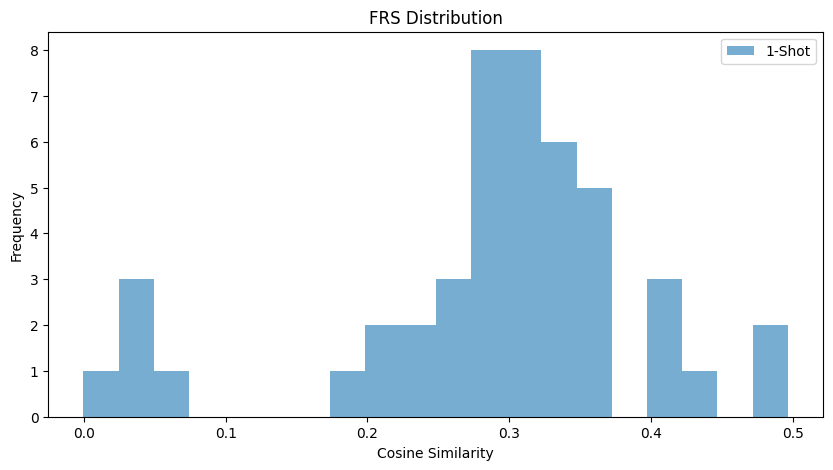

In [ ]:
plt.figure(figsize=(10, 5))

plt.hist(
    frs_1shot,
    bins=20,
    alpha=0.6,
    label="1-Shot"
)

plt.xlabel("Cosine Similarity")

plt.ylabel("Frequency")

plt.title("FRS Distribution")

plt.legend()

plt.show()

In [ ]:
lpips_model = lpips.LPIPS(net='alex').to(device)

lpips_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map

In [ ]:
def compute_lpips_diversity(image_paths):

    distances = []

    pairs = []

    for i in range(len(image_paths)):

        for j in range(i + 1, len(image_paths)):

            pairs.append((i, j))

    random.shuffle(pairs)

    pairs = pairs[:50]

    for i, j in tqdm(pairs):

        img1 = Image.open(image_paths[i]).convert("RGB")

        img2 = Image.open(image_paths[j]).convert("RGB")

        img1 = lpips_transform(img1).unsqueeze(0).to(device)

        img2 = lpips_transform(img2).unsqueeze(0).to(device)

        with torch.no_grad():

            dist = lpips_model(
                img1,
                img2
            )

        distances.append(
            dist.item()
        )

    return distances

In [ ]:
div_1shot = compute_lpips_diversity(
    gen_1shot[:30]
)

print("\n1-Shot Diversity")

print("Mean LPIPS:", np.mean(div_1shot))

100%|██████████| 50/50 [00:00<00:00, 51.57it/s]


1-Shot Diversity
Mean LPIPS: 0.4005498617887497


/tmp/ipykernel_76810/306871004.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


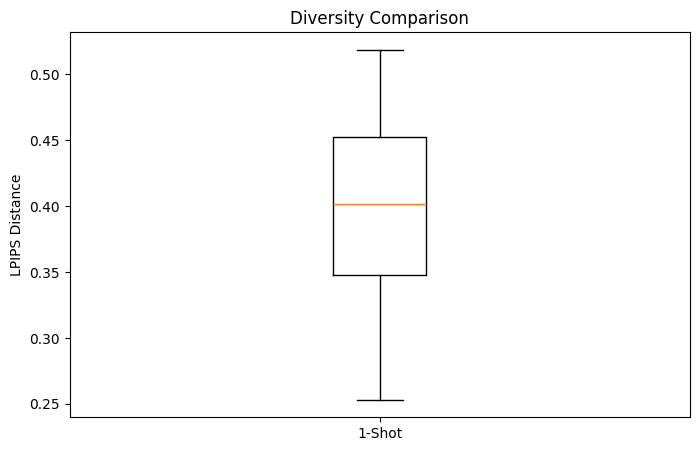

In [ ]:
plt.figure(figsize=(8, 5))

plt.boxplot(
    [div_1shot],
    labels=["1-Shot"]
)

plt.ylabel("LPIPS Distance")

plt.title("Diversity Comparison")

plt.show()

In [ ]:
real_embeddings = []

real_paths = []

for path in tqdm(all_real_images):

    emb = get_arcface_embedding(path)

    if emb is None:
        continue

    real_embeddings.append(emb)

    real_paths.append(path)

real_embeddings = np.array(real_embeddings)

print("Real embeddings:", real_embeddings.shape)

print("Real paths:", len(real_paths))

  4%|▎         | 1/28 [00:00<00:04,  6.35it/s]/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/insightface/utils/face_align.py:23: FutureWarning: `estimate` is deprecated since version 0.26 and will be removed in version 2.2. Please use `SimilarityTransform.from_estimate` class constructor instead.
  tform.estimate(lmk, dst)
100%|██████████| 28/28 [00:15<00:00,  1.81it/s]

Real embeddings: (21, 512)
Real paths: 21


In [ ]:
def nearest_neighbor(
    gen_path,
    real_embeddings,
    real_paths
):

    gen_emb = get_arcface_embedding(gen_path)

    if gen_emb is None:
        return None

    sims = cosine_similarity(
        [gen_emb],
        real_embeddings
    )[0]

    idx = np.argmax(sims)

    return real_paths[idx], float(sims[idx])

/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/insightface/utils/face_align.py:23: FutureWarning: `estimate` is deprecated since version 0.26 and will be removed in version 2.2. Please use `SimilarityTransform.from_estimate` class constructor instead.
  tform.estimate(lmk, dst)
/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/insightface/utils/face_align.py:23: FutureWarning: `estimate` is deprecated since version 0.26 and will be removed in version 2.2. Please use `SimilarityTransform.from_estimate` class constructor instead.
  tform.estimate(lmk, dst)
/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/insightface/utils/face_align.py:23: FutureWarning: `estimate` is deprecated since version 0.26 and will be removed in version 2.2. Please use `SimilarityTransform.from_estimate` class constructor instead.
  tform.estimate(lmk, dst)
/scratch/RDS_RS02810_AML/.venv/lib/python3.12/site-packages/insightface/utils/face_align.py:23: FutureWarning: `estimate` is

Valid Face Matches: 12


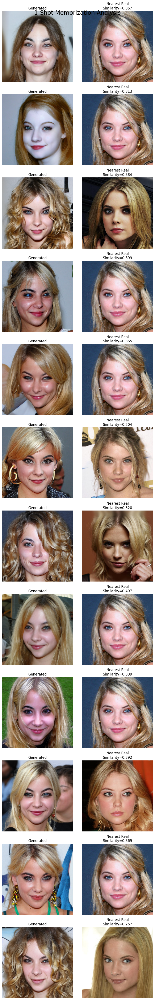

In [ ]:
# ======================================================
# MEMORIZATION CHECK
# ======================================================

sample_gen = random.sample(gen_1shot, 100)

valid_pairs = []

for gen_path in sample_gen:

    result = nearest_neighbor(
        gen_path,
        real_embeddings,
        real_paths
    )

    if result is not None:

        valid_pairs.append((gen_path, result))

print("Valid Face Matches:", len(valid_pairs))

if len(valid_pairs) == 0:

    print("No valid face detections found.")

else:

    fig, axes = plt.subplots(
        len(valid_pairs),
        2,
        figsize=(8, 4 * len(valid_pairs))
    )

    if len(valid_pairs) == 1:
        axes = [axes]

    for row, (gen_path, (nn_path, sim)) in enumerate(valid_pairs):

        gen_img = Image.open(gen_path)

        nn_img = Image.open(nn_path)

        axes[row][0].imshow(gen_img)

        axes[row][0].set_title("Generated")

        axes[row][0].axis("off")

        axes[row][1].imshow(nn_img)

        axes[row][1].set_title(
            f"Nearest Real\nSimilarity={sim:.3f}"
        )

        axes[row][1].axis("off")

    plt.suptitle(
        "1-Shot Memorization Analysis",
        fontsize=20
    )

    plt.tight_layout()

    plt.show()